# Surrogate Model Imports - Data Processing

## Imports

In [2]:
# Standard imports
import os
import glob

In [3]:
#Third-party imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from cycler import cycler

# Ax
from ax.service.ax_client import AxClient
from ax.modelbridge.cross_validation import cross_validate,compute_diagnostics
from ax.plot.diagnostic import interact_cross_validation
from ax.plot.contour import interact_contour
from ax.utils.notebook.plotting import init_notebook_plotting, render
init_notebook_plotting()


[INFO 08-15 18:30:06] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.
[INFO 08-15 18:30:06] ax.utils.notebook.plotting: Please see
    (https://ax.dev/tutorials/visualizations.html#Fix-for-plots-that-are-not-rendering)
    if visualizations are not rendering.


In [4]:
# Set location of the data
base_folder =  r"C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data"

## Loading experiment results - Ax Experiments

In [5]:
def proccess_data(folder, compute_fit_diagnostics=True, show_cross_validation=False):
    """ Loads the results of a calibration run done in Ax into an Ax client object, extracts trials and fit diagnostics.
    Arguments:
        folder: path to the folder where the snapshot is saved as 'history.json'
        compute_fit_diagnostics: if True, compute the Ax interactive cross generation object on load. This can be slow.
        show_cross_validation: if True, display the Ax interactive cross generation object on load. This can get in the way if loading a lot of data at once in a loop.       
    Returns:
        df: trials dataframe from Ax Client, enriched with lowest error trace data and how long each trial took to generate.
        diagnostics: dictionary of useful diagnostic data on the results of cross-validation of each underlying prediction model.
        client: the Ax Client object
    
    """
    # Load the snapshot into a client object
    client = AxClient.load_from_json_file(os.path.join(folder, 'history.json'))
    # Get the dataframe with all the tried parameters and outputs.
    df = client.get_trials_data_frame()
    # Add a column to track the error of best point found so far over the course of the optimisation
    df['cumulative_lowest_error'] = df['error'].cummin()

    # Get the generation time for each trial - that is how long it took to compute the Acquisition Function and choose this set of parameters for this trial
    trials_dict = client.experiment.trials
    df['gen_time'] = [trials_dict[t].generator_run.gen_time for t in trials_dict]

    # Cross validate the results of the model that was trained on all the trial data 
    # Splits the model's training data into train/test folds (leave-one-out by default) and makes out-of-sample predictions on the test folds.
    if compute_fit_diagnostics:
        # The snapshot loads the client object without the models being fitted, re-do that now as we need it for the cross validation
        client.fit_model()
        cv = cross_validate(client.generation_strategy.model)
        if show_cross_validation:
            render(interact_cross_validation(cv))
        diagnostics = compute_diagnostics(cv)
    else:
        diagnostics = {}
        
    return df, diagnostics, client

In [105]:
# Show an example of the outputs

# This optimisation was of a surrogate model of the Highlands data with 11 simulation runs, parallel factor of 1, and using the error as the optimisation objective
example_folder = r"C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--12-40-07"

example_df, example_diagnostics, example_client = proccess_data(example_folder, show_cross_validation=True)


[INFO 08-09 11:49:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-09 11:49:03] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-09 11:49:17] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-09 11:49:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


The cross-validation plots show that the emergency fitted better than the delays in the results of the optimisation.
Let's look at the diagnostics numbers.

In [110]:
# It's a dictionary, but easier to view here as a dataframe
pd.DataFrame(example_diagnostics)

,Mean prediction CI,MAPE,wMAPE,Total raw effect,Correlation coefficient,Rank correlation,Fisher exact test p,Log likelihood,MSE
emergency,0.080769,0.017906,0.018966,2.106839,0.991008,0.987992,2.909032e-09,-144.623920,219.728972
emergency_from_actual,1.478954,0.414501,0.174314,436.146824,0.984764,0.960038,2.647945e-07,95.800037,0.002026
delays,0.186614,0.055368,0.042515,2.472197,0.922407,0.228143,3.761856e-01,-145.571030,29.263739
delays_from_actual,0.884038,0.309944,0.228795,14.555437,0.922403,0.228143,3.761856e-01,40.155149,0.002706
error,1.797358,0.732902,0.723876,408.072060,0.838064,0.623827,1.282239e-02,-670.237311,497101.762490


I will use the correlation coefficient of the cross-validated actuals vs predictions to measure the fit quality. In this case the fit of the emergency outputs is best at 0.99 and the error fit is worst at 0.84.

In [111]:
example_df

,trial_index,arm_name,trial_status,generation_method,delays,delays_from_actual,emergency,emergency_from_actual,error,dd-los,gw-non-covid-los,syswatch-scale,cumulative_lowest_error,gen_time
0,0,0_0,COMPLETED,Sobol,28.555394,0.725429,420.910968,0.146896,1972.172302,26.973269,5.192990,0.832813,1972.172302,0.000
1,1,1_0,COMPLETED,Sobol,79.170705,0.238743,361.365621,0.015353,206.042501,59.196841,3.910923,0.895500,206.042501,0.000
2,2,2_0,COMPLETED,Sobol,48.324751,0.535339,665.364178,0.812981,3411.095561,39.037966,8.926349,0.873237,206.042501,0.000
3,3,3_0,COMPLETED,Sobol,67.811818,0.347963,223.119356,0.392045,989.200834,51.525671,1.576571,0.914382,206.042501,0.000
4,4,4_0,COMPLETED,Sobol,93.878648,0.097321,279.802724,0.237595,237.321312,86.131354,2.368178,0.970875,206.042501,0.000
5,5,5_0,COMPLETED,Sobol,85.821090,0.174797,596.578486,0.625554,1518.740808,87.365607,7.515709,0.963472,206.042501,0.000
6,6,6_0,COMPLETED,BoTorch,89.315891,0.141193,324.157473,0.116737,120.827238,80.507842,3.271406,0.903503,120.827238,2.719
7,7,7_0,COMPLETED,BoTorch,95.144831,0.085146,366.253807,0.002033,26.114225,71.306587,3.794079,0.958739,26.114225,2.719
8,8,8_0,COMPLETED,BoTorch,94.756775,0.088877,375.776635,0.023915,30.495800,95.615261,4.005795,0.965999,26.114225,4.515
9,9,9_0,COMPLETED,BoTorch,90.192835,0.132761,385.120379,0.049374,72.228104,82.072883,4.257314,0.927269,26.114225,3.031


We can see the parameters tried (dd-los, gw-non-covid-los, syswatch-scale), together with all the outputs produced by the objective function (delays, delays_from_actual, emergency, emergency_from_actual, error). <br>
As expected, the first 6 iterations were quasi-random trials, and all the following were using the BoTorch generation step,
 in this case made up of a Gaussian Process with inferred noise and qLogNoisyExpectedimprovement.


In [147]:
# It's not actually that easy to get to the bottom of what is actually being used, though the Ax website does give the logic for how the default models are chosen.

# But you can check on the object like this
print("Surrogate Model: ")
print(example_client.generation_strategy.model.model.surrogate._model)

# You would look at the parameters like this
# Trained parameters
# print("Params: ")

# for k, v in example_client.generation_strategy.model.model.surrogate._model.named_parameters():
#     print(k, ": ")
#     print(v)
#     print(" ")

Surrogate Model: 
SingleTaskGP(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (noise_prior): GammaPrior()
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (mean_module): ConstantMean()
  (covar_module): ScaleKernel(
    (base_kernel): MaternKernel(
      (lengthscale_prior): GammaPrior()
      (raw_lengthscale_constraint): Positive()
    )
    (outputscale_prior): GammaPrior()
    (raw_outputscale_constraint): Positive()
  )
)


In [150]:
example_client.get_best_parameters(use_model_predictions=False)

({'dd-los': 73.20701243793746,
  'gw-non-covid-los': 4.137201176582522,
  'syswatch-scale': 0.9007123805985497},
 ({'emergency': 371.364876259,
   'emergency_from_actual': 0.0118933958,
   'delays': 99.1499526051,
   'delays_from_actual': 0.0466350711,
   'error': 8.3386177942},
  {'emergency': {'emergency': nan},
   'emergency_from_actual': {'emergency_from_actual': nan},
   'delays': {'delays': nan},
   'delays_from_actual': {'delays_from_actual': nan},
   'error': {'error': nan}}))

In [163]:
render(example_client.get_feature_importances())

In [170]:
model = example_client.generation_strategy.model
render(interact_contour(model=model, metric_name="delays_from_actual"))

In [171]:
render(interact_contour(model=model, metric_name="emergency_from_actual"))

## Combining the Results from multiple runs

In [6]:
def mean_and_sem_of_trials(dfs, metric):
    """ Combines a metric from multiple runs with the same parameters in order to find the mean and standard error of that metric
    Arguments:
        dfs: iterable of pandas dataframes where each row is one of the trials, and contains a column with a metric to track over the course of optimisation
        metric: name of column to track mean and sem for
    Returns:
        df: a single dataframe with the trial index as the index and columns for the means and errors over all the runs passed

    """
    combined_dfs = pd.concat(dfs, axis=1)
    # Optimisation runs with incomplete data will be dropped
    combined_dfs = combined_dfs[[metric]].dropna(axis=1,how='any')
    mean = combined_dfs.mean(axis=1)
    sem = combined_dfs.sem(axis=1)
    count = combined_dfs.count(axis=1)
    positive_error = mean + sem
    negative_error = mean - sem
    return pd.DataFrame({'mean': mean, 'sem':sem, 'positive_error': positive_error, 'negative_error':negative_error, 'count': count})


In [7]:
def get_data_from_experiments(fp, compute_fit_diagnostics=True):
    """ Collects data for all the runs matching the file pattern
    Arguments:
        fp: file pattern representing a set optimisation runs with the same parameters
        compute_fit_diagnostics: whether or not to perform cross-validation
    Returns:
        dictionary with the results of process_data for each optimisation matching the file pattern
    """
    clients = []
    diagnostics = []
    trial_dfs = []
    for fld in glob.glob(os.path.join(base_folder, fp)):
        print("getting data for: ", fld)
        my_df, my_diagnostics, my_client = proccess_data(fld, compute_fit_diagnostics)
        clients.append(my_client)
        diagnostics.append(my_diagnostics)
        trial_dfs.append(my_df)
    
    return {
        'clients': clients,
        'diagnostics': diagnostics,
        'trial_dfs': trial_dfs
    }



In [8]:
# Collecting the results of multiple settings with multiple runs each for comparison

# Highlands run 11 reps surrogate
experiment_outputs = {}

# Get single-objective sequential 
folder_prefix = '11_1_True_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix, compute_fit_diagnostics=False)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get single-objective parallel 
folder_prefix = '11_2_True_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix, compute_fit_diagnostics=False)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get multi-objective sequential
folder_prefix = '11_1_False_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix, compute_fit_diagnostics=False)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get multi-objective parallel
folder_prefix = '11_2_False_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix, compute_fit_diagnostics=False)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--09-53-23


[INFO 08-15 18:34:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:00] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--10-47-02


[INFO 08-15 18:34:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:00] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--11-44-38


[INFO 08-15 18:34:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--12-40-07


[INFO 08-15 18:34:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--13-24-13


[INFO 08-15 18:34:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-30--15-10-50


[INFO 08-15 18:34:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--04-47-12


[INFO 08-15 18:34:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--09-35-01


[INFO 08-15 18:34:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--10-30-01


[INFO 08-15 18:34:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--11-27-23


[INFO 08-15 18:34:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--12-22-53


[INFO 08-15 18:34:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--13-23-39


[INFO 08-15 18:34:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--14-55-35


[INFO 08-15 18:34:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-07-31--15-42-31


[INFO 08-15 18:34:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--00-25-13


[INFO 08-15 18:34:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--01-10-47


[INFO 08-15 18:34:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--07-50-03


[INFO 08-15 18:34:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--10-27-21


[INFO 08-15 18:34:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--11-16-28


[INFO 08-15 18:34:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--12-05-32


[INFO 08-15 18:34:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--12-57-59


[INFO 08-15 18:34:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--13-55-13


[INFO 08-15 18:34:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--14-49-51


[INFO 08-15 18:34:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:07] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--15-47-32


[INFO 08-15 18:34:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:07] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--16-59-26


[INFO 08-15 18:34:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:07] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--17-54-27


[INFO 08-15 18:34:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--18-39-01


[INFO 08-15 18:34:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-01--21-22-53


[INFO 08-15 18:34:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-02--02-05-52


[INFO 08-15 18:34:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_True_2024-08-02--09-03-43


[INFO 08-15 18:34:09] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:09] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-30--10-10-41


[INFO 08-15 18:34:09] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:09] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-30--11-03-31


[INFO 08-15 18:34:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-30--12-03-57


[INFO 08-15 18:34:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-30--12-54-08


[INFO 08-15 18:34:11] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:11] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-30--13-36-44


[INFO 08-15 18:34:12] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-30--19-22-36


[INFO 08-15 18:34:12] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--06-01-30


[INFO 08-15 18:34:13] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:13] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--09-50-43


[INFO 08-15 18:34:14] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:14] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--10-43-17


[INFO 08-15 18:34:14] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:14] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--11-45-17


[INFO 08-15 18:34:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:15] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--12-42-39


[INFO 08-15 18:34:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:15] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--13-36-47


[INFO 08-15 18:34:16] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--15-09-17


[INFO 08-15 18:34:17] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-07-31--18-55-06


[INFO 08-15 18:34:17] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--00-38-19


[INFO 08-15 18:34:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--03-21-44


[INFO 08-15 18:34:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--09-54-31


[INFO 08-15 18:34:19] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:19] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--10-46-08


[INFO 08-15 18:34:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:20] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--11-32-20


[INFO 08-15 18:34:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:20] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--12-20-41


[INFO 08-15 18:34:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--13-17-26


[INFO 08-15 18:34:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--14-07-12


[INFO 08-15 18:34:22] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--15-06-07


[INFO 08-15 18:34:22] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--16-17-20


[INFO 08-15 18:34:23] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:23] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--17-16-24


[INFO 08-15 18:34:24] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:24] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--18-06-46


[INFO 08-15 18:34:24] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:24] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--20-54-13


[INFO 08-15 18:34:25] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:25] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-01--21-38-57


[INFO 08-15 18:34:26] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:26] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_True_2024-08-02--06-18-52


[INFO 08-15 18:34:26] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:26] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-30--10-01-12


[INFO 08-15 18:34:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-30--10-54-21


[INFO 08-15 18:34:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-30--11-50-54


[INFO 08-15 18:34:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-30--12-45-37


[INFO 08-15 18:34:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:28] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-30--13-29-32


[INFO 08-15 18:34:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:28] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-30--17-16-44


[INFO 08-15 18:34:29] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:29] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--04-53-55


[INFO 08-15 18:34:29] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:29] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--09-41-38


[INFO 08-15 18:34:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:30] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--10-33-22


[INFO 08-15 18:34:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:30] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--11-33-54


[INFO 08-15 18:34:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--12-30-20


[INFO 08-15 18:34:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--13-30-10


[INFO 08-15 18:34:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--15-01-21


[INFO 08-15 18:34:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-07-31--16-48-30


[INFO 08-15 18:34:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--00-30-40


[INFO 08-15 18:34:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--01-16-12


[INFO 08-15 18:34:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--09-45-49


[INFO 08-15 18:34:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--10-34-35


[INFO 08-15 18:34:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--11-22-49


[INFO 08-15 18:34:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--12-12-52


[INFO 08-15 18:34:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--13-05-33


[INFO 08-15 18:34:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--14-00-54


[INFO 08-15 18:34:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:35] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--14-56-46


[INFO 08-15 18:34:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--15-56-44


[INFO 08-15 18:34:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--17-07-35


[INFO 08-15 18:34:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--18-01-03


[INFO 08-15 18:34:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--18-45-01


[INFO 08-15 18:34:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-01--21-28-07


[INFO 08-15 18:34:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_1_False_2024-08-02--04-12-08


[INFO 08-15 18:34:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-30--10-25-38


[INFO 08-15 18:34:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-30--11-25-04


[INFO 08-15 18:34:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:39] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-30--12-22-25


[INFO 08-15 18:34:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-30--13-06-00


[INFO 08-15 18:34:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-30--13-50-48


[INFO 08-15 18:34:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-30--22-32-16


[INFO 08-15 18:34:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--09-15-14


[INFO 08-15 18:34:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--10-07-29


[INFO 08-15 18:34:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--11-01-19


[INFO 08-15 18:34:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--12-01-48


[INFO 08-15 18:34:45] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:45] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--13-02-34


[INFO 08-15 18:34:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--13-53-39


[INFO 08-15 18:34:47] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--15-23-30


[INFO 08-15 18:34:47] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-07-31--22-09-16


[INFO 08-15 18:34:48] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:48] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--00-52-09


[INFO 08-15 18:34:49] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:49] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--05-36-42


[INFO 08-15 18:34:50] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:50] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--10-12-03


[INFO 08-15 18:34:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--11-01-23


[INFO 08-15 18:34:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--11-46-48


[INFO 08-15 18:34:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--12-37-36


[INFO 08-15 18:34:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--13-35-00


[INFO 08-15 18:34:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--14-21-44


[INFO 08-15 18:34:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--15-22-46


[INFO 08-15 18:34:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--16-42-36


[INFO 08-15 18:34:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--17-35-59


[INFO 08-15 18:34:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--18-20-37


[INFO 08-15 18:34:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--21-08-14


[INFO 08-15 18:34:58] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:58] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-01--22-52-29


[INFO 08-15 18:34:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:34:59] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\11_2_False_2024-08-02--06-27-32


[INFO 08-15 18:35:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-15 18:35:00] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


### SkOpt
We need to understand whether Ax parallel is an improvement of Ax sequential, and also whether it is an improvement of the current SkOpt version trained on the same objective function.

In [9]:
skopt_trace = pd.read_csv(r'C:\Users\hannag01\Documents\parallel-bayesopt-experiments\data\skopt_agg_trace_highlands_surrogate_2024-07-16_11_2.csv')
skopt_trace.head()

,Unnamed: 0,mean,sem,positive_error,negative_error,count
0,0,1305.324551,225.885090,1531.209641,1079.439461,30
1,1,589.945089,106.837186,696.782275,483.107903,30
2,2,295.780990,59.058346,354.839337,236.722644,30
3,3,268.995297,52.576459,321.571756,216.418838,30
4,4,259.652984,51.537173,311.190157,208.115810,30


In [10]:
# Data on fit quality for the SkOpt calibrations
skopt_coco = pd.read_csv(r'C:\Users\hannag01\Documents\parallel-bayesopt-experiments\data\skopt_highlands_surrogate_2024-07-14_11_crossval_coefficient.csv')

## Estimating Wall-Clock Time
Because the experiments are run using the surrogate model as the objective function, trial generation time dominates over evaluation time. <br>
We want to estimate how long these runs might take when using the real model where evaluation time dominates.

In [11]:
# timing estimates
estimated_model_runtime = 5.9 * 60
warmup_time = 20

# can do all initialisations in parallel without penalty
num_initialisation_runs = 6

In [12]:
def runtime_by_parallellization_factor(pfactor, runtime, num_trials):
    """ Create an array of estimated run times for the runs after the initialisation runs are completed.

    Assumes that several runs in parallel will take the same length of time as a single run in sequence

    Arguments:
        pfactor: parallelisation factor, where 1 is sequential, 2 is 2 at a time, etc.
        runtime: estimatated time that the api will take to return the results of a trial in seconds
        num_trials: number of non-initialisation trials
    Returns:
        Array of length num_trials with an estimate of how long each trial might take.
    """
    # The number of rounds that would be needed will be the number of trials divided by the parallel factor rounded up
    num_rounds = np.ceil(num_trials / pfactor)
    # Array for one round
    arr = np.zeros(pfactor)
    # Assume only the first iteration of a run takes time, the rest are free
    arr[0] = runtime
    # Repeat this array for num_rounds
    newarr = np.tile(arr, int(num_rounds))
    # chop off any unneeded trials at the end of the array
    return newarr[:num_trials]

def calculate_runtime(df, pfactor, runtime, num_initialisation_runs):
    """ Calculates wall-clock time as the estimated time since the intialisation runs were completed
    Arguments:
        df: A dataframe of trial data including the gen_time column
        pfactor: parallelisation factor, where 1 is sequential, 2 is 2 at a time, etc.
        runtime: estimatated time that the api will take to return the results of a trial in seconds
        num_initialisation_runs: how many of the trials were initialisation runs
    Returns:
        array of estimated wall-clock time
    """
    non_initialisation_runs = len(df) - num_initialisation_runs
    runtime_data = runtime_by_parallellization_factor(pfactor, runtime, non_initialisation_runs)
    total_time = df['gen_time'][num_initialisation_runs:].values + runtime_data
    return np.concatenate([np.zeros(num_initialisation_runs), total_time]).cumsum()

In [13]:
# Add the time data into the dict

# Get single-objective sequential 
folder_prefix = '11_1_True_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 1, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

# Get single-objective parallel 
folder_prefix = '11_2_True_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 2, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

# Get multi-objective sequential
folder_prefix = '11_1_False_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 1, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

# Get multi-objective parallel
folder_prefix = '11_2_False_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 2, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

In [14]:
# time estimate per run for the SkOpt sequential optimisations
# gentime estimated by timing an optimisation run of the surrogate, subtracting the evaluation time, and dividing by the number of trials
skopt_gentime_estimate_per_it = 0.3868
eval_estimate = estimated_model_runtime + warmup_time

skopt_time_per_it = skopt_gentime_estimate_per_it + eval_estimate
pd.Timedelta(skopt_time_per_it, 's').round('s')

Timedelta('0 days 00:06:14')

## Results

In [15]:
def plot_by_API_calls(experiment_dict, trace_str, trace_label, skopt_trace, save_file_path=None, include_skopt=True):
    """Function to make the output plots from the results"""
    fig, ax = plt.subplots()
    
    line_cycler   = (cycler(color=["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00", "#CC79A7", "#F0E442"]) +
                 cycler(linestyle=["-", "--", "-.", ":", "-", "--", "-."]))

    ax.set_prop_cycle(line_cycler)

    for i, ts in enumerate(trace_str):
        trace_df = experiment_dict[ts]['trace_lowest_error']
        print(f"Number of calibrations {trace_label[i]}: {trace_df['count'][0]}")
        ax.plot(trace_df.index.values, np.log10(trace_df['mean']), label=trace_label[i])
        ax.fill_between(trace_df.index.values, np.log10(trace_df['positive_error']), np.log10(trace_df['negative_error']), alpha=0.5)

    
    if include_skopt:
        print(f"Number of calibrations SkOpt: {skopt_trace['count'][0]}")
        ax.plot(skopt_trace.index.values, np.log10(skopt_trace['mean']), label='SkOpt')
        ax.fill_between(skopt_trace.index.values, np.log10(skopt_trace['positive_error']), np.log10(skopt_trace['negative_error']), alpha=0.5,)

    plt.xlabel("API calls")
    plt.ylabel("Log mean lowest error")
    plt.legend()

    if save_file_path:
        plt.savefig(save_file_path)

    plt.show()

Number of calibrations Ax Parallel=2 Single: 29
Number of calibrations Ax Parallel=1 Single: 29
Number of calibrations SkOpt: 30


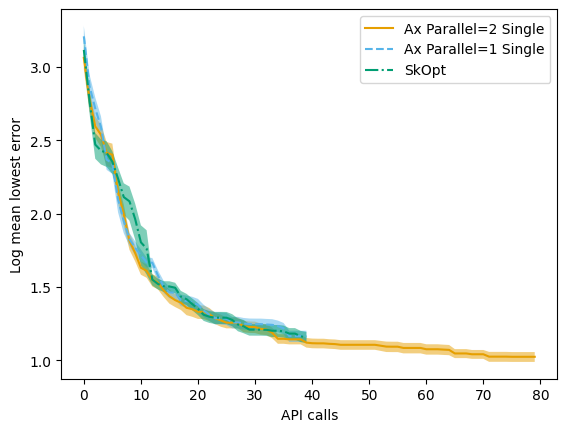

In [16]:
plot_by_API_calls(experiment_outputs, ['11_2_True_*','11_1_True_*'], ['Ax Parallel=2 Single', 'Ax Parallel=1 Single'], skopt_trace, save_file_path=r"../plots/highland_single_objective_surrogate_poc.png")

Number of calibrations Ax Parallel=2 Multi: 29
Number of calibrations Ax Parallel=1 Multi: 29
Number of calibrations SkOpt: 30


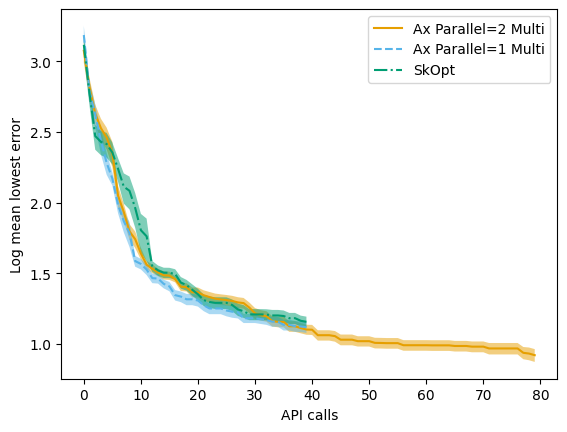

In [17]:
# Multi-objective mode in Ax version highlands
plot_by_API_calls(experiment_outputs, ['11_2_False_*','11_1_False_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=1 Multi'], skopt_trace, save_file_path=r"../plots/highland_multi_objective_surrogate_poc.png")

In [18]:
def plot_by_time(experiment_dict, trace_str, trace_label, skopt_trace, skopt_time_per_it, save_file_path=None, num_initialisation_runs=6, include_skopt=True):
    """Function to make the output plots from the results"""
    fig, ax = plt.subplots()

    line_cycler   = (cycler(color=["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00", "#CC79A7", "#F0E442"]) +
                 cycler(linestyle=["-", "--", "-.", ":", "-", "--", "-."]))

    ax.set_prop_cycle(line_cycler)

    for i, ts in enumerate(trace_str):
        # Looking at the trace AFTER the initialisation runs for time estimation
        # That is because the paralellisation of the intialisation runs might be set independently        
        trace_df = experiment_dict[ts]['trace_lowest_error'][num_initialisation_runs:]
        wc_df = experiment_dict[ts]['trace_wallclock'][num_initialisation_runs:]

        print(f"Number of calibrations {trace_label[i]}: {trace_df['count'].values[0]}")
        ax.plot(wc_df['mean']/(60 * 60), np.log10(trace_df['mean']), label=trace_label[i])
        ax.fill_between(wc_df['mean']/(60 * 60), np.log10(trace_df['positive_error']), np.log10(trace_df['negative_error']), alpha=0.5)

    if include_skopt:
        print(f"Number of calibrations SkOpt: {skopt_trace['count'][0]}")
        # Get the time axis for the skopt data
        skopt_df = skopt_trace[num_initialisation_runs:]
        sk_secs = (np.ones(len(skopt_df)) * skopt_time_per_it).cumsum()
        ax.plot(sk_secs/(60 * 60), np.log10(skopt_df['mean']), label='SkOpt')
        ax.fill_between(sk_secs/(60 * 60), np.log10(skopt_df['positive_error']), np.log10(skopt_df['negative_error']), alpha=0.5,)

    plt.xlabel("Wallclock time (hours)")
    plt.ylabel("Log mean lowest error")
    plt.legend()

    if save_file_path:
        plt.savefig(save_file_path)

    plt.show()

Number of calibrations Ax Parallel=2 Single: 29
Number of calibrations Ax Parallel=1 Single: 29
Number of calibrations SkOpt: 30


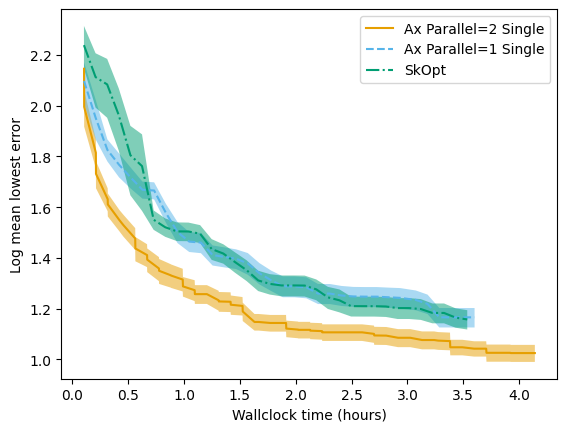

In [19]:
plot_by_time(experiment_outputs, ['11_2_True_*','11_1_True_*'], ['Ax Parallel=2 Single', 'Ax Parallel=1 Single'], skopt_trace, skopt_time_per_it, save_file_path=r"../plots/highland_single_objective_surrogate_poc_wct.png")

Number of calibrations Ax Parallel=2 Multi: 29
Number of calibrations Ax Parallel=1 Multi: 29
Number of calibrations SkOpt: 30


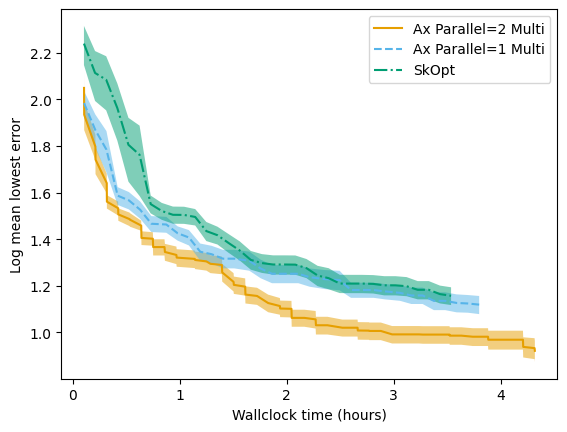

In [20]:
plot_by_time(experiment_outputs, ['11_2_False_*','11_1_False_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=1 Multi'], skopt_trace, skopt_time_per_it, save_file_path=r"../plots/highland_multi_objective_surrogate_poc_wct.png")

Number of calibrations Ax Parallel=2 Multi: 29
Number of calibrations Ax Parallel=2 Single: 29
Number of calibrations SkOpt: 30


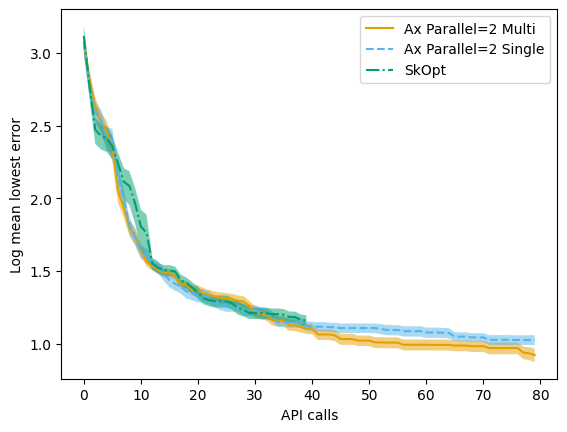

In [21]:
plot_by_API_calls(experiment_outputs, ['11_2_False_*','11_2_True_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=2 Single'], skopt_trace, save_file_path=r"../plots//highland_single_vs_multi_objective_surrogate_poc.png")

Number of calibrations Ax Parallel=2 Multi: 29
Number of calibrations Ax Parallel=2 Single: 29
Number of calibrations SkOpt: 30


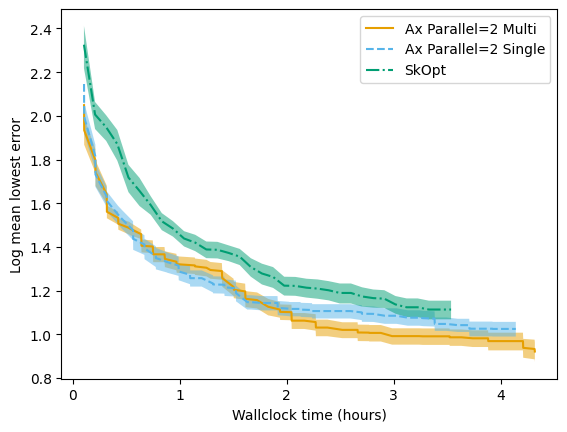

In [224]:
plot_by_time(experiment_outputs, ['11_2_False_*','11_2_True_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=2 Single'], skopt_trace, skopt_time_per_it, save_file_path=r"../plots/highland_single_vs_multi_objective_surrogate_poc_wct.png")

## Comparing the fit quality

In [237]:
# Density plot of pearson correlation coefficient, Ax vs SkOpt
def fit_compare_density(ax_corellation_data, skopt_correlation_data, ax_label, save_file_path=None):
    fig, ax = plt.subplots()
    line_cycler   = (cycler(color=["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00", "#CC79A7", "#F0E442"]) +
                 cycler(linestyle=["-", "--", "-.", ":", "-", "--", "-."]))

    ax.set_prop_cycle(line_cycler)
    pd.Series(error_corr).plot(kind='density', label=ax_label)
    skopt_correlation_data['correlation_coefficient'].plot(kind='density', label='SkOpt')
    plt.xlabel("Pearson Correlation Coefficient - Error Predictions vs Observations")
    ax.set_xlim([0, 1])
    plt.legend()

    if save_file_path:
        plt.savefig(save_file_path)
    
    plt.show()

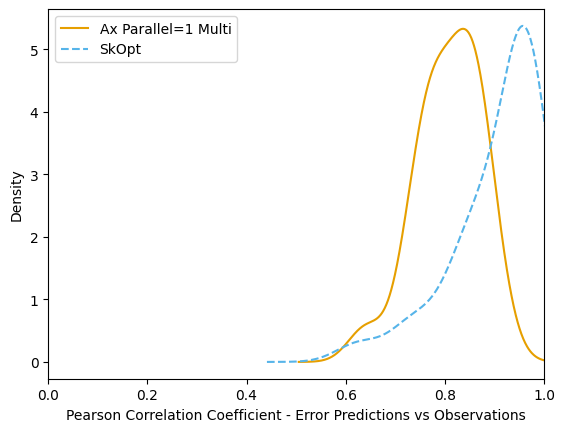

In [238]:
multi_sequential_diagnostics = experiment_outputs['11_1_False_*']['diagnostics']
multi_sequential_error_corr = [d['Correlation coefficient']['error'] for d in multi_sequential_diagnostics]

fit_compare_density(multi_sequential_error_corr, skopt_coco, 'Ax Parallel=1 Multi', save_file_path=r"../plots/highland_multi_seq_vs_skopt_fit_density.png")

## Repeat with Grampian Data

In [239]:
# Collecting the results of multiple settings with multiple runs each for comparison

# Grampian run 11 reps surrogate
# experiment_outputs = {}

# Get single-objective sequential 
folder_prefix = 'GRAMPIAN_11_1_True_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get single-objective parallel 
folder_prefix = 'GRAMPIAN_11_2_True_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get multi-objective sequential
folder_prefix = 'GRAMPIAN_11_1_False_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get multi-objective parallel
folder_prefix = 'GRAMPIAN_11_2_False_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--09-07-06


[INFO 08-10 11:46:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:46:41] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:46:48] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:46:48] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--10-20-02


[INFO 08-10 11:46:50] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:46:50] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:46:55] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:46:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--11-29-46


[INFO 08-10 11:46:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:46:56] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:47:05] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:47:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--12-34-49


[INFO 08-10 11:47:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:47:07] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:47:16] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:47:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--13-41-09


[INFO 08-10 11:47:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:47:18] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:47:32] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:47:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--15-48-29


[INFO 08-10 11:47:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:47:44] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:47:52] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:47:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-02--17-01-55


[INFO 08-10 11:47:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:47:54] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:48:04] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:48:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--07-50-53


[INFO 08-10 11:48:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:48:06] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:48:17] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:48:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--09-02-23


[INFO 08-10 11:48:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:48:20] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:48:40] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:48:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--10-03-25


[INFO 08-10 11:48:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:48:42] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:48:54] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:48:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--11-16-47


[INFO 08-10 11:48:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:48:56] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:49:07] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:49:07] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--12-25-25


[INFO 08-10 11:49:09] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:49:09] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:49:21] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:49:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--13-35-12


[INFO 08-10 11:49:23] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:49:23] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:49:31] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:49:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--14-47-47


[INFO 08-10 11:49:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:49:33] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:49:48] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:49:48] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--16-08-29


[INFO 08-10 11:49:50] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:49:50] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:50:01] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:50:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--17-13-48


[INFO 08-10 11:50:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:50:04] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:50:12] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:50:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--18-26-56


[INFO 08-10 11:50:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:50:15] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:50:25] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:50:25] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--19-35-15


[INFO 08-10 11:50:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:50:27] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:50:38] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:50:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--20-33-33


[INFO 08-10 11:50:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:50:41] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:50:51] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:50:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-05--21-36-18


[INFO 08-10 11:50:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:50:53] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:51:09] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:51:09] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--01-01-56


[INFO 08-10 11:51:11] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:51:11] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:51:23] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:51:23] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--02-10-52


[INFO 08-10 11:51:25] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:51:25] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:51:41] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:51:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--03-10-10


[INFO 08-10 11:51:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:51:43] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:51:53] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:51:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--04-16-40


[INFO 08-10 11:51:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:51:55] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:52:08] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:52:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--05-26-18


[INFO 08-10 11:52:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:52:10] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:52:21] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:52:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--06-26-54


[INFO 08-10 11:52:23] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:52:23] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:52:37] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:52:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--07-34-11


[INFO 08-10 11:52:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:52:39] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:52:52] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:52:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--08-39-02


[INFO 08-10 11:52:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:52:54] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:53:11] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:53:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--09-45-14


[INFO 08-10 11:53:14] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:53:14] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:53:25] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:53:25] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--10-54-12


[INFO 08-10 11:53:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:53:27] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:53:38] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:53:39] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--12-20-00


[INFO 08-10 11:53:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:53:41] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:53:50] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:53:50] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--13-23-25


[INFO 08-10 11:53:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:53:53] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:54:02] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:54:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--14-32-46


[INFO 08-10 11:54:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:54:05] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:54:22] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:54:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_True_2024-08-06--15-38-42


[INFO 08-10 11:54:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:54:27] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:54:40] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:54:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--09-32-38


[INFO 08-10 11:54:45] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:54:45] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:55:06] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:55:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--10-35-41


[INFO 08-10 11:55:13] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:55:13] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:55:36] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:55:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--11-47-51


[INFO 08-10 11:55:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:55:43] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:55:57] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:55:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--12-51-14


[INFO 08-10 11:56:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:56:03] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:56:18] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:56:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--14-07-07


[INFO 08-10 11:56:23] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:56:23] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:56:37] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:56:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--16-07-07


[INFO 08-10 11:56:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:56:42] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:56:54] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:56:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-02--17-28-58


[INFO 08-10 11:56:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:56:59] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:57:24] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:57:24] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--08-10-02


[INFO 08-10 11:57:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:57:30] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:57:47] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:57:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--09-20-44


[INFO 08-10 11:57:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:57:52] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:58:09] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:58:09] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--10-27-29


[INFO 08-10 11:58:14] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:58:14] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:58:30] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:58:30] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--11-36-19


[INFO 08-10 11:58:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:58:35] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:58:51] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:58:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--12-43-43


[INFO 08-10 11:58:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:58:56] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:59:08] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:59:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--13-53-10


[INFO 08-10 11:59:13] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:59:13] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:59:28] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:59:28] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--15-08-11


[INFO 08-10 11:59:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:59:33] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 11:59:49] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 11:59:50] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--16-27-46


[INFO 08-10 11:59:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 11:59:55] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:00:11] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:00:11] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--17-34-37


[INFO 08-10 12:00:16] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:00:16] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:00:40] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:00:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--18-44-46


[INFO 08-10 12:00:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:00:44] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:01:01] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:01:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--19-51-22


[INFO 08-10 12:01:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:01:06] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:01:23] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:01:23] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--20-51-17


[INFO 08-10 12:01:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:01:28] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:01:46] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:01:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-05--22-01-29


[INFO 08-10 12:01:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:01:51] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:02:10] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:02:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--01-23-46


[INFO 08-10 12:02:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:02:15] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:02:29] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:02:29] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--02-31-24


[INFO 08-10 12:02:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:02:34] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:02:47] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:02:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--03-29-28


[INFO 08-10 12:02:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:02:52] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:03:05] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:03:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--04-39-25


[INFO 08-10 12:03:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:03:10] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:03:26] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:03:26] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--05-45-25


[INFO 08-10 12:03:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:03:31] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:03:45] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:03:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--06-45-31


[INFO 08-10 12:03:50] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:03:50] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:04:04] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:04:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--07-51-31


[INFO 08-10 12:04:09] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:04:09] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:04:28] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:04:28] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--08-58-59


[INFO 08-10 12:04:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:04:35] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:04:55] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:04:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--10-04-28


[INFO 08-10 12:05:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:05:00] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:05:15] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:05:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--11-13-32


[INFO 08-10 12:05:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:05:20] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:05:32] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:05:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--12-38-08


[INFO 08-10 12:05:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:05:37] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:05:53] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:05:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--13-41-58


[INFO 08-10 12:05:58] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:05:58] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:06:16] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:06:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--14-55-11


[INFO 08-10 12:06:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:06:21] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:06:39] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:06:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_True_2024-08-06--15-59-51


[INFO 08-10 12:06:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:06:44] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:06:55] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:06:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--09-13-15


[INFO 08-10 12:06:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:06:57] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:07:11] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:07:11] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--10-25-21


[INFO 08-10 12:07:13] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:07:13] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:07:21] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:07:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--11-36-29


[INFO 08-10 12:07:24] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:07:24] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:07:33] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:07:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--12-40-28


[INFO 08-10 12:07:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:07:35] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:07:46] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:07:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--13-48-58


[INFO 08-10 12:07:49] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:07:49] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:08:02] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:08:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--15-54-52


[INFO 08-10 12:08:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:08:05] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:08:19] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:08:19] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-02--17-09-47


[INFO 08-10 12:08:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:08:21] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:08:35] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:08:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--07-57-29


[INFO 08-10 12:08:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:08:38] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:08:48] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:08:48] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--09-08-26


[INFO 08-10 12:08:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:08:51] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:09:05] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:09:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--10-08-36


[INFO 08-10 12:09:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:09:07] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:09:26] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:09:26] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--11-21-49


[INFO 08-10 12:09:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:09:28] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:09:41] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:09:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--12-31-27


[INFO 08-10 12:09:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:09:44] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:09:55] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:09:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--13-41-07


[INFO 08-10 12:09:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:09:57] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:10:17] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:10:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--14-54-39


[INFO 08-10 12:10:19] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:10:19] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:10:27] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:10:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--16-14-13


[INFO 08-10 12:10:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:10:30] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:10:44] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:10:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--17-20-24


[INFO 08-10 12:10:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:10:46] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:10:56] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:10:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--18-32-14


[INFO 08-10 12:10:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:10:59] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:11:13] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:11:13] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--19-40-38


[INFO 08-10 12:11:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:11:15] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:11:25] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:11:25] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--20-41-07


[INFO 08-10 12:11:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:11:27] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:11:36] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:11:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-05--21-43-29


[INFO 08-10 12:11:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:11:38] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:12:02] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:12:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--01-08-57


[INFO 08-10 12:12:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:12:05] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:12:18] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:12:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--02-18-05


[INFO 08-10 12:12:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:12:20] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:12:38] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:12:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--03-15-58


[INFO 08-10 12:12:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:12:40] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:12:55] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:12:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--04-23-23


[INFO 08-10 12:12:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:12:57] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:13:09] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:13:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--05-32-03


[INFO 08-10 12:13:12] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:13:12] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:13:25] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:13:25] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--06-33-04


[INFO 08-10 12:13:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:13:27] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:13:38] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:13:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--07-40-42


[INFO 08-10 12:13:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:13:40] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:13:57] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:13:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--08-46-33


[INFO 08-10 12:13:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:13:59] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:14:12] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:14:13] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--09-51-46


[INFO 08-10 12:14:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:14:15] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:14:27] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:14:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--11-00-26


[INFO 08-10 12:14:29] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:14:29] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:14:51] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:14:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--12-26-30


[INFO 08-10 12:14:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:14:53] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:15:02] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:15:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--13-28-47


[INFO 08-10 12:15:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:15:04] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:15:16] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:15:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--14-38-31


[INFO 08-10 12:15:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:15:18] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:15:36] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:15:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_1_False_2024-08-06--15-44-15


[INFO 08-10 12:15:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:15:39] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:15:52] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:15:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--09-47-39


[INFO 08-10 12:15:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:15:55] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:16:08] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:16:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--10-50-41


[INFO 08-10 12:16:13] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:16:13] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:16:32] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:16:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--12-02-18


[INFO 08-10 12:16:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:16:39] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:16:55] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:16:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--13-03-10


[INFO 08-10 12:17:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:17:00] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:17:13] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:17:13] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--14-24-18


[INFO 08-10 12:17:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:17:18] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:17:35] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:17:35] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--16-20-43


[INFO 08-10 12:17:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:17:40] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:17:57] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:17:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-02--17-48-17


[INFO 08-10 12:18:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:18:02] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:18:21] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:18:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--08-26-32


[INFO 08-10 12:18:26] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:18:26] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:18:56] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:18:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--09-35-05


[INFO 08-10 12:19:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:19:01] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:19:13] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:19:13] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--10-43-48


[INFO 08-10 12:19:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:19:18] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:19:32] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:19:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--11-49-22


[INFO 08-10 12:19:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:19:38] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:19:56] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:19:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--12-56-46


[INFO 08-10 12:20:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:20:02] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:20:22] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:20:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--14-06-13


[INFO 08-10 12:20:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:20:27] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:20:42] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:20:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--15-23-33


[INFO 08-10 12:20:47] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:20:47] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:21:33] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:21:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--16-41-12


[INFO 08-10 12:21:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:21:38] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:21:52] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:21:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--17-51-44


[INFO 08-10 12:21:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:21:57] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:22:16] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:22:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--18-59-13


[INFO 08-10 12:22:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:22:21] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:22:42] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:22:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--20-05-14


[INFO 08-10 12:22:48] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:22:48] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:23:04] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:23:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--21-05-01


[INFO 08-10 12:23:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:23:10] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:23:23] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:23:24] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-05--22-16-50


[INFO 08-10 12:23:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:23:28] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:23:49] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:23:50] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--01-35-15


[INFO 08-10 12:23:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:23:54] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:24:19] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:24:20] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--02-44-07


[INFO 08-10 12:24:24] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:24:24] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:24:41] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:24:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--03-41-58


[INFO 08-10 12:24:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:24:46] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:25:14] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:25:14] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--04-53-20


[INFO 08-10 12:25:19] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:25:19] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:25:36] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:25:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--05-58-02


[INFO 08-10 12:25:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:25:41] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:25:57] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:25:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--07-00-15


[INFO 08-10 12:26:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:26:02] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:26:23] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:26:23] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--08-07-03


[INFO 08-10 12:26:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:26:30] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:26:45] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:26:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--09-14-49


[INFO 08-10 12:26:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:26:51] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:27:10] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:27:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--10-21-18


[INFO 08-10 12:27:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:27:15] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:27:33] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:27:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--11-27-47


[INFO 08-10 12:27:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:27:39] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:27:58] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:27:58] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--12-51-26


[INFO 08-10 12:28:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:28:03] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:28:21] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:28:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--13-57-55


[INFO 08-10 12:28:26] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:28:26] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:28:44] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:28:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_2_False_2024-08-06--15-06-27


[INFO 08-10 12:28:49] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 08-10 12:28:49] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 08-10 12:29:03] ax.service.ax_client: Successfully instantiated a model for the first time.
[WARNING 08-10 12:29:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


In [240]:
# Add the time data into the dict

# Get single-objective sequential 
folder_prefix = 'GRAMPIAN_11_1_True_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 1, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

# Get single-objective parallel 
folder_prefix = 'GRAMPIAN_11_2_True_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 2, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

# Get multi-objective sequential
folder_prefix = 'GRAMPIAN_11_1_False_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 1, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

# Get multi-objective parallel
folder_prefix = 'GRAMPIAN_11_2_False_*'
for df in experiment_outputs[folder_prefix]['trial_dfs']:
    timings_data = calculate_runtime(df, 2, estimated_model_runtime + warmup_time, 6)
    df['estimatated_wallclock_time_seconds'] = timings_data
experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

In [248]:
skopt_trace = pd.read_csv(r'C:\Users\hannag01\Documents\parallel-bayesopt-experiments\data\skopt_agg_trace_grampian_surrogate.csv')
skopt_trace.head()

,Unnamed: 0,mean,sem,positive_error,negative_error,count
0,0,323.420925,68.088546,391.509470,255.332379,30
1,1,154.070314,36.867376,190.937690,117.202937,30
2,2,94.093320,19.542868,113.636188,74.550451,30
3,3,57.664186,11.342196,69.006382,46.321991,30
4,4,41.625746,8.037747,49.663493,33.587998,30


In [260]:
# Data on fit quality for the SkOpt calibrations
skopt_coco = pd.read_csv(r'C:\Users\hannag01\Documents\parallel-bayesopt-experiments\data\skopt_grampian_surrogate_crossval_coefficient.csv')

Number of calibrations Ax Parallel=2 Single: 33
Number of calibrations Ax Parallel=1 Single: 34
Number of calibrations SkOpt: 30


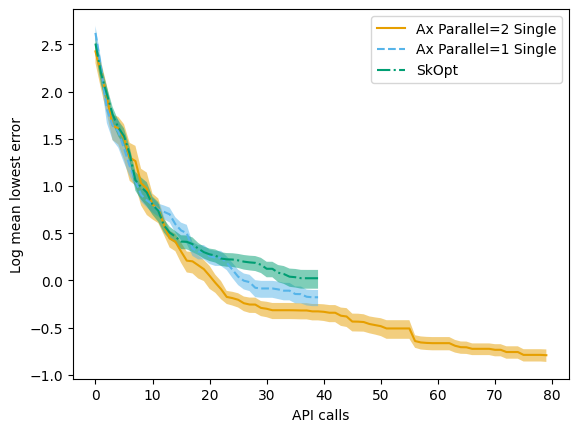

In [254]:
plot_by_API_calls(experiment_outputs, ['GRAMPIAN_11_2_True_*','GRAMPIAN_11_1_True_*'], ['Ax Parallel=2 Single', 'Ax Parallel=1 Single'], skopt_trace, save_file_path=r"../plots/grampian_single_objective_surrogate_poc.png")

Number of calibrations Ax Parallel=2 Multi: 33
Number of calibrations Ax Parallel=1 Multi: 34
Number of calibrations SkOpt: 30


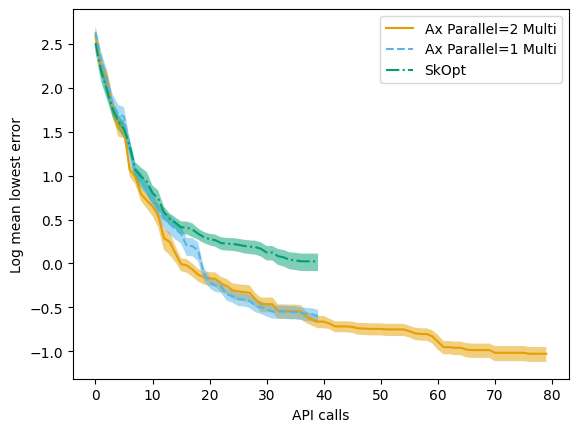

In [255]:
# Multi-objective mode in Ax version
plot_by_API_calls(experiment_outputs, ['GRAMPIAN_11_2_False_*','GRAMPIAN_11_1_False_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=1 Multi'], skopt_trace, save_file_path=r"../plots/grampian_multi_objective_surrogate_poc.png")

Number of calibrations Ax Parallel=2 Multi: 33
Number of calibrations Ax Parallel=2 Single: 33
Number of calibrations SkOpt: 30


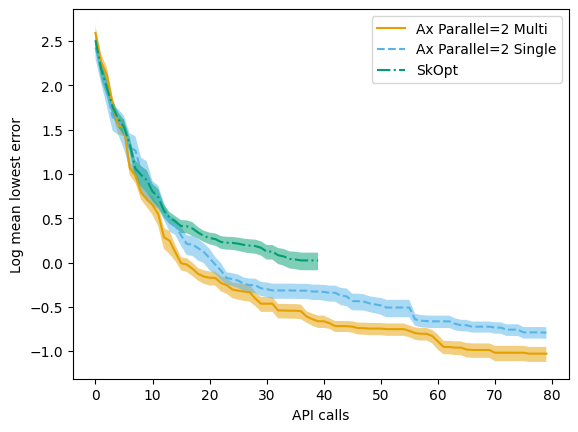

In [259]:
# Multi-objective mode in Ax version
plot_by_API_calls(experiment_outputs, ['GRAMPIAN_11_2_False_*','GRAMPIAN_11_2_True_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=2 Single'], skopt_trace, save_file_path=r"../plots/grampian_single_vs_multi_objective_surrogate_poc_its.png")

Number of calibrations Ax Parallel=2 Single: 33
Number of calibrations Ax Parallel=1 Single: 34
Number of calibrations SkOpt: 30


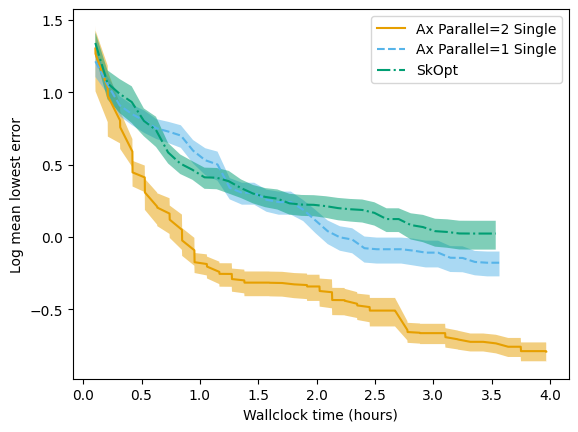

In [256]:
plot_by_time(experiment_outputs, ['GRAMPIAN_11_2_True_*','GRAMPIAN_11_1_True_*'], ['Ax Parallel=2 Single', 'Ax Parallel=1 Single'], skopt_trace, skopt_time_per_it, save_file_path=r"../plots/grampian_single_objective_surrogate_poc_wct.png")

Number of calibrations Ax Parallel=2 Multi: 33
Number of calibrations Ax Parallel=1 Multi: 34
Number of calibrations SkOpt: 30


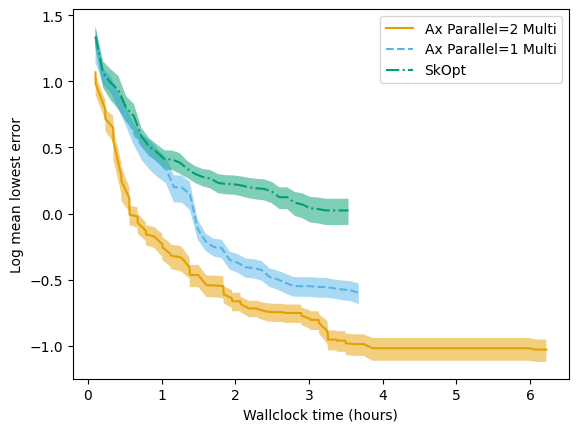

In [257]:
plot_by_time(experiment_outputs, ['GRAMPIAN_11_2_False_*','GRAMPIAN_11_1_False_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=1 Multi'], skopt_trace, skopt_time_per_it, save_file_path=r"../plots/grampian_multi_objective_surrogate_poc_wct.png")

Number of calibrations Ax Parallel=2 Multi: 33
Number of calibrations Ax Parallel=2 Single: 33
Number of calibrations SkOpt: 30


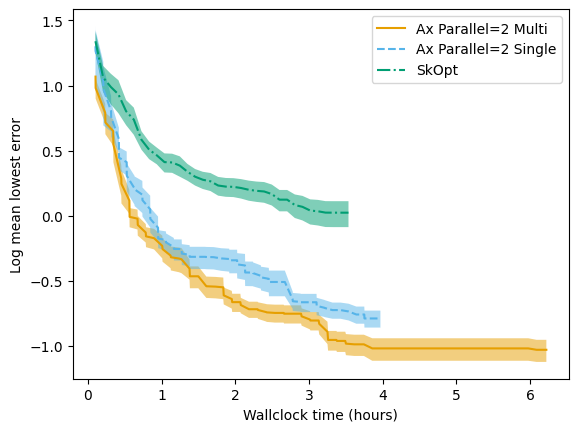

In [258]:
plot_by_time(experiment_outputs, ['GRAMPIAN_11_2_False_*','GRAMPIAN_11_2_True_*'], ['Ax Parallel=2 Multi', 'Ax Parallel=2 Single'], skopt_trace, skopt_time_per_it, save_file_path=r"../plots/grampian_single_vs_multi_objective_surrogate_poc_wct.png")

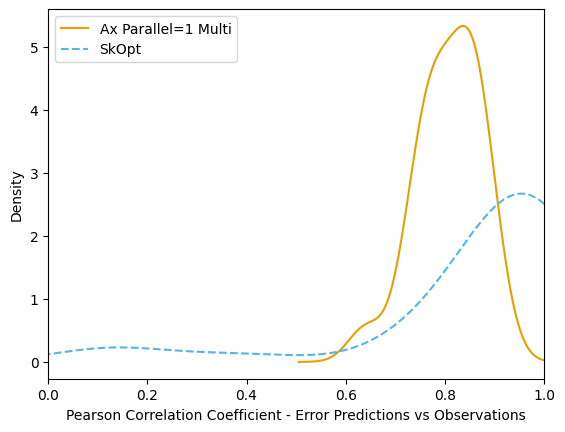

In [261]:
multi_sequential_diagnostics = experiment_outputs['GRAMPIAN_11_1_False_*']['diagnostics']
multi_sequential_error_corr = [d['Correlation coefficient']['error'] for d in multi_sequential_diagnostics]

fit_compare_density(multi_sequential_error_corr, skopt_coco, 'Ax Parallel=1 Multi', save_file_path=r"../plots/grampian_multi_seq_vs_skopt_fit_density.png")

## Increasing the parallel factor

In [ ]:
# Collecting the results of multiple settings with multiple runs each for comparison

# Grampian run 11 reps surrogate
# experiment_outputs = {}

# Get single-objective sequential 
folder_prefix = 'GRAMPIAN_11_1_True_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get single-objective parallel 
folder_prefix = 'GRAMPIAN_11_2_True_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get multi-objective sequential
folder_prefix = 'GRAMPIAN_11_1_False_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

# Get multi-objective parallel
folder_prefix = 'GRAMPIAN_11_2_False_*'
experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix)
experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

In [267]:
for n in range(3,10):
    for objective in [True, False]:
        folder_prefix = f"GRAMPIAN_11_{n}_{objective}_*"
        experiment_outputs[folder_prefix] = get_data_from_experiments(folder_prefix, compute_fit_diagnostics=False)
        experiment_outputs[folder_prefix]['trace_lowest_error'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'cumulative_lowest_error')
        experiment_outputs[folder_prefix]['trace_gen_time'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'gen_time')

        for df in experiment_outputs[folder_prefix]['trial_dfs']:
            timings_data = calculate_runtime(df, n, estimated_model_runtime + warmup_time, 6)
            df['estimatated_wallclock_time_seconds'] = timings_data
        experiment_outputs[folder_prefix]['trace_wallclock'] = mean_and_sem_of_trials(experiment_outputs[folder_prefix]['trial_dfs'], 'estimatated_wallclock_time_seconds')

getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-07--22-47-57


[INFO 08-10 14:13:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-08--10-41-04


[INFO 08-10 14:13:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-08--13-40-04


[INFO 08-10 14:13:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-08--16-40-36


[INFO 08-10 14:13:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-08--19-27-43


[INFO 08-10 14:13:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-08--22-13-19


[INFO 08-10 14:13:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-09--00-59-55


[INFO 08-10 14:13:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-09--03-52-23


[INFO 08-10 14:13:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-09--06-38-51


[INFO 08-10 14:13:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-09--09-25-33


[INFO 08-10 14:13:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:35] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-09--12-32-39


[INFO 08-10 14:13:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_True_2024-08-09--15-31-56


[INFO 08-10 14:13:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-08--07-46-41


[INFO 08-10 14:13:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-08--10-49-00


[INFO 08-10 14:13:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-08--13-48-08


[INFO 08-10 14:13:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-08--16-47-52


[INFO 08-10 14:13:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-08--19-34-37


[INFO 08-10 14:13:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-08--22-20-42


[INFO 08-10 14:13:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:39] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-09--01-07-38


[INFO 08-10 14:13:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:39] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-09--03-59-24


[INFO 08-10 14:13:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-09--06-46-18


[INFO 08-10 14:13:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-09--09-33-34


[INFO 08-10 14:13:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-09--12-40-51


[INFO 08-10 14:13:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_3_False_2024-08-09--15-40-28


[INFO 08-10 14:13:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-08--08-09-44


[INFO 08-10 14:13:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-08--11-07-02


[INFO 08-10 14:13:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-08--14-07-09


[INFO 08-10 14:13:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-08--17-04-15


[INFO 08-10 14:13:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-08--19-51-32


[INFO 08-10 14:13:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-08--22-39-21


[INFO 08-10 14:13:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-09--01-23-29


[INFO 08-10 14:13:45] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:45] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-09--04-18-06


[INFO 08-10 14:13:45] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:45] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-09--07-05-34


[INFO 08-10 14:13:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-09--09-53-10


[INFO 08-10 14:13:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-09--12-59-46


[INFO 08-10 14:13:47] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_True_2024-08-09--16-03-16


[INFO 08-10 14:13:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-08--08-17-56


[INFO 08-10 14:13:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-08--11-15-00


[INFO 08-10 14:13:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-08--14-15-22


[INFO 08-10 14:13:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-08--17-10-42


[INFO 08-10 14:13:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-08--19-58-55


[INFO 08-10 14:13:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-08--22-46-25


[INFO 08-10 14:13:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-09--01-30-45


[INFO 08-10 14:13:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-09--04-25-45


[INFO 08-10 14:13:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-09--07-14-18


[INFO 08-10 14:13:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-09--10-00-47


[INFO 08-10 14:13:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-09--13-09-00


[INFO 08-10 14:13:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_4_False_2024-08-09--16-11-39


[INFO 08-10 14:13:58] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:58] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-08--08-35-50


[INFO 08-10 14:13:58] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:58] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-08--11-36-45


[INFO 08-10 14:13:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:59] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-08--14-40-48


[INFO 08-10 14:13:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:13:59] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-08--17-27-23


[INFO 08-10 14:14:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:00] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-08--20-14-55


[INFO 08-10 14:14:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:00] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-08--23-02-42


[INFO 08-10 14:14:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-09--01-45-16


[INFO 08-10 14:14:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-09--04-42-15


[INFO 08-10 14:14:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-09--07-31-31


[INFO 08-10 14:14:02] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:02] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-09--10-18-32


[INFO 08-10 14:14:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-09--13-31-59


[INFO 08-10 14:14:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:03] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_True_2024-08-09--16-34-37


[INFO 08-10 14:14:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-08--08-43-08


[INFO 08-10 14:14:04] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:04] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-08--11-45-28


[INFO 08-10 14:14:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-08--14-48-42


[INFO 08-10 14:14:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:05] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-08--17-33-46


[INFO 08-10 14:14:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-08--20-21-55


[INFO 08-10 14:14:06] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-08--23-09-21


[INFO 08-10 14:14:07] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:07] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-09--01-52-58


[INFO 08-10 14:14:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-09--04-49-32


[INFO 08-10 14:14:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:08] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-09--07-37-45


[INFO 08-10 14:14:09] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:09] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-09--10-27-30


[INFO 08-10 14:14:09] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:09] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-09--13-40-16


[INFO 08-10 14:14:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_5_False_2024-08-09--16-43-28


[INFO 08-10 14:14:10] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:10] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-08--09-05-07


[INFO 08-10 14:14:11] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:11] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-08--12-03-53


[INFO 08-10 14:14:11] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:11] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-08--15-04-05


[INFO 08-10 14:14:12] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-08--17-50-11


[INFO 08-10 14:14:12] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-08--20-37-43


[INFO 08-10 14:14:12] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:12] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-08--23-24-27


[INFO 08-10 14:14:13] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:13] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-09--02-10-18


[INFO 08-10 14:14:14] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:14] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-09--05-05-13


[INFO 08-10 14:14:14] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:14] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-09--07-51-34


[INFO 08-10 14:14:15] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:15] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-09--10-43-21


[INFO 08-10 14:14:16] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-09--13-59-49


[INFO 08-10 14:14:16] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:16] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_True_2024-08-09--17-04-20


[INFO 08-10 14:14:17] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-08--09-12-56


[INFO 08-10 14:14:17] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:17] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-08--12-11-10


[INFO 08-10 14:14:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-08--15-11-32


[INFO 08-10 14:14:18] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:18] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-08--17-59-35


[INFO 08-10 14:14:19] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:19] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-08--20-44-56


[INFO 08-10 14:14:19] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:19] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-08--23-30-46


[INFO 08-10 14:14:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:20] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-09--02-17-33


[INFO 08-10 14:14:20] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:20] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-09--05-12-31


[INFO 08-10 14:14:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-09--07-59-35


[INFO 08-10 14:14:21] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:21] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-09--10-51-37


[INFO 08-10 14:14:22] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-09--14-07-09


[INFO 08-10 14:14:22] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:22] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_6_False_2024-08-09--17-14-18


[INFO 08-10 14:14:26] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:26] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-08--09-31-19


[INFO 08-10 14:14:26] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:26] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-08--12-26-37


[INFO 08-10 14:14:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-08--15-28-33


[INFO 08-10 14:14:27] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:27] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-08--18-17-16


[INFO 08-10 14:14:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:28] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-08--20-58-50


[INFO 08-10 14:14:28] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:28] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-08--23-48-13


[INFO 08-10 14:14:29] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:29] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-09--02-33-10


[INFO 08-10 14:14:29] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:29] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-09--05-27-03


[INFO 08-10 14:14:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:30] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-09--08-16-33


[INFO 08-10 14:14:30] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:30] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-09--11-12-02


[INFO 08-10 14:14:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_True_2024-08-09--14-22-28


[INFO 08-10 14:14:31] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:31] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-08--09-38-16


[INFO 08-10 14:14:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-08--12-35-23


[INFO 08-10 14:14:32] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:32] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-08--15-35-21


[INFO 08-10 14:14:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-08--18-26-03


[INFO 08-10 14:14:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:33] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-08--21-06-54


[INFO 08-10 14:14:34] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:34] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-08--23-56-05


[INFO 08-10 14:14:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:35] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-09--02-41-34


[INFO 08-10 14:14:35] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:35] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-09--05-34-29


[INFO 08-10 14:14:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-09--08-24-06


[INFO 08-10 14:14:36] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:36] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-09--11-21-34


[INFO 08-10 14:14:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_7_False_2024-08-09--14-30-52


[INFO 08-10 14:14:37] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:37] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-08--09-51-16


[INFO 08-10 14:14:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-08--12-54-24


[INFO 08-10 14:14:38] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:38] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-08--15-50-29


[INFO 08-10 14:14:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:39] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-08--18-40-29


[INFO 08-10 14:14:39] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:39] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-08--21-28-24


[INFO 08-10 14:14:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-09--00-14-59


[INFO 08-10 14:14:40] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:40] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-09--03-00-58


[INFO 08-10 14:14:41] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:41] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-09--05-48-02


[INFO 08-10 14:14:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-09--08-41-12


[INFO 08-10 14:14:42] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-09--11-43-34


[INFO 08-10 14:14:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_True_2024-08-09--14-44-56


[INFO 08-10 14:14:43] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-08--10-00-43


[INFO 08-10 14:14:44] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:44] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-08--13-02-48


[INFO 08-10 14:14:45] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:45] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-08--15-59-04


[INFO 08-10 14:14:45] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:45] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-08--18-48-47


[INFO 08-10 14:14:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-08--21-37-19


[INFO 08-10 14:14:46] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:46] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-09--00-23-35


[INFO 08-10 14:14:47] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-09--03-07-28


[INFO 08-10 14:14:47] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:47] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-09--05-56-04


[INFO 08-10 14:14:48] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:48] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-09--08-48-39


[INFO 08-10 14:14:48] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:48] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-09--11-52-23


[INFO 08-10 14:14:49] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:49] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_8_False_2024-08-09--14-53-26


[INFO 08-10 14:14:50] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:50] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-08--10-17-34


[INFO 08-10 14:14:50] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:50] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-08--13-18-06


[INFO 08-10 14:14:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-08--16-18-05


[INFO 08-10 14:14:51] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:51] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-08--19-04-37


[INFO 08-10 14:14:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-08--21-50-44


[INFO 08-10 14:14:52] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:52] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-09--00-37-49


[INFO 08-10 14:14:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-09--03-25-41


[INFO 08-10 14:14:53] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:53] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-09--06-13-51


[INFO 08-10 14:14:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-09--09-04-50


[INFO 08-10 14:14:54] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:54] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-09--12-09-18


[INFO 08-10 14:14:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_True_2024-08-09--15-06-57


[INFO 08-10 14:14:55] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:55] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-08--10-26-20


[INFO 08-10 14:14:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-08--13-26-28


[INFO 08-10 14:14:56] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:56] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-08--16-26-05


[INFO 08-10 14:14:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-08--19-11-51


[INFO 08-10 14:14:57] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:57] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-08--21-58-57


[INFO 08-10 14:14:58] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:58] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-09--00-44-59


[INFO 08-10 14:14:58] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:58] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-09--03-33-22


[INFO 08-10 14:14:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:59] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-09--06-22-30


[INFO 08-10 14:14:59] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:14:59] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-09--09-12-46


[INFO 08-10 14:15:00] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:15:00] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-09--12-17-33


[INFO 08-10 14:15:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:15:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


getting data for:  C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\data\GRAMPIAN_11_9_False_2024-08-09--15-14-07


[INFO 08-10 14:15:01] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 08-10 14:15:01] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


Number of calibrations Ax Parallel=1 Single: 34
Number of calibrations Ax Parallel=2 Single: 33
Number of calibrations Ax Parallel=3 Single: 12


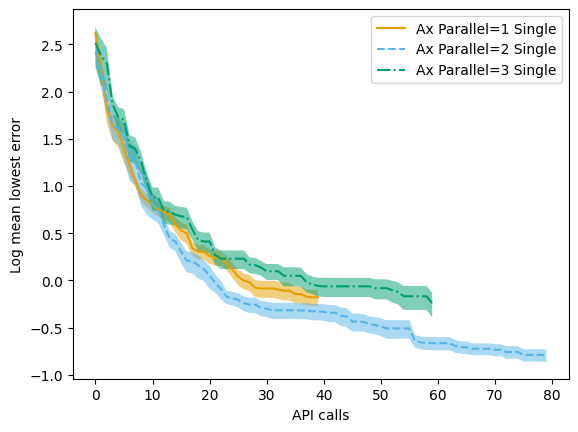

In [271]:
# Single objective
ids=[f"GRAMPIAN_11_{n}_True_*" for n in range(1,4)]
labels = [f"Ax Parallel={n} Single" for n in range(1,4)]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False)

Number of calibrations Ax Parallel=3 Single: 12
Number of calibrations Ax Parallel=4 Single: 12
Number of calibrations Ax Parallel=5 Single: 12


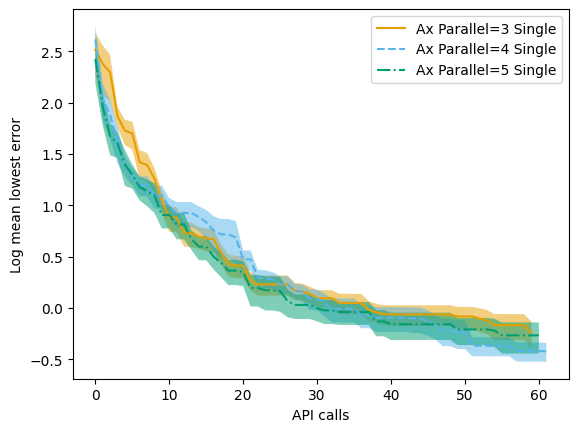

In [273]:
# Single objective
ids=[f"GRAMPIAN_11_{n}_True_*" for n in range(3,6)]
labels = [f"Ax Parallel={n} Single" for n in range(3,6)]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False)

Number of calibrations Ax Parallel=6 Single: 12
Number of calibrations Ax Parallel=7 Single: 11
Number of calibrations Ax Parallel=8 Single: 11


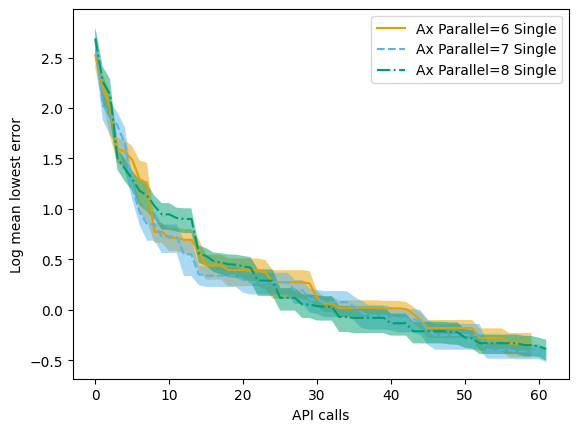

In [274]:
# Single objective
ids=[f"GRAMPIAN_11_{n}_True_*" for n in range(6,9)]
labels = [f"Ax Parallel={n} Single" for n in range(6,9)]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False)

Number of calibrations Ax Parallel=4 Single: 12
Number of calibrations Ax Parallel=6 Single: 12
Number of calibrations Ax Parallel=9 Single: 11


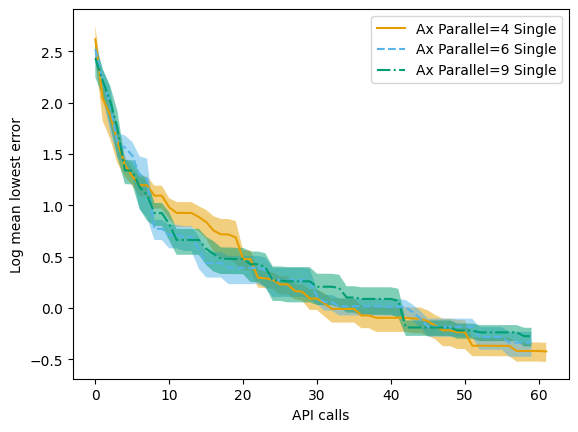

In [276]:
# Single objective
nums = [4,6,9]
ids=[f"GRAMPIAN_11_{n}_True_*" for n in nums]
labels = [f"Ax Parallel={n} Single" for n in nums]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False)

In [301]:
# Multi objective
nums = [2,9]
ids=[f"GRAMPIAN_11_{n}_False_*" for n in nums]
labels = [f"Ax Parallel={n} Multi" for n in nums]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False, save_file_path=r"../plots/grampian_2_9_its.png")

SyntaxError: keyword argument repeated: save_file_path (2708675656.py, line 5)

Number of calibrations Ax Parallel=3 Multi: 12
Number of calibrations Ax Parallel=6 Multi: 11
Number of calibrations Ax Parallel=9 Multi: 11


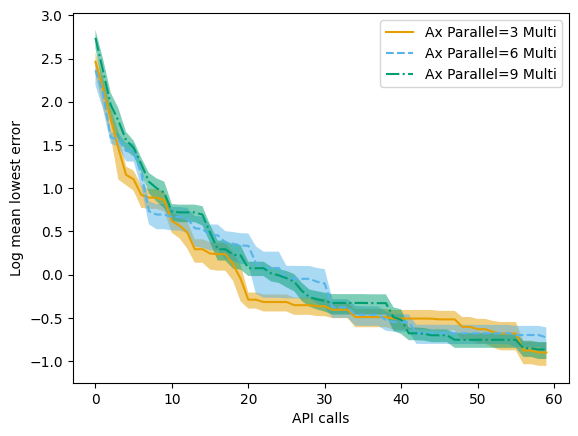

In [278]:
# Multi objective
nums = [3,6,9]
ids=[f"GRAMPIAN_11_{n}_False_*" for n in nums]
labels = [f"Ax Parallel={n} Multi" for n in nums]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False)

Number of calibrations Ax Parallel=2 Multi: 33
Number of calibrations Ax Parallel=5 Multi: 12
Number of calibrations Ax Parallel=9 Multi: 11


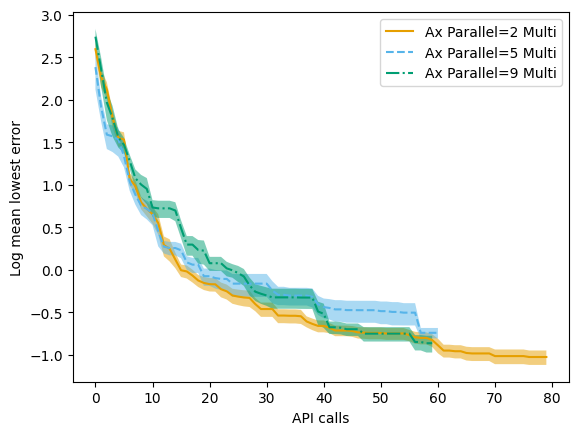

In [283]:
# Multi objective
nums = [2,5,9]
ids=[f"GRAMPIAN_11_{n}_False_*" for n in nums]
labels = [f"Ax Parallel={n} Multi" for n in nums]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, save_file_path=None, include_skopt=False)

Number of calibrations Ax Parallel=9 Single: 11
Number of calibrations Ax Parallel=9 Multi: 11
Number of calibrations Ax Parallel=3 Single: 12
Number of calibrations Ax Parallel=3 Multi: 12


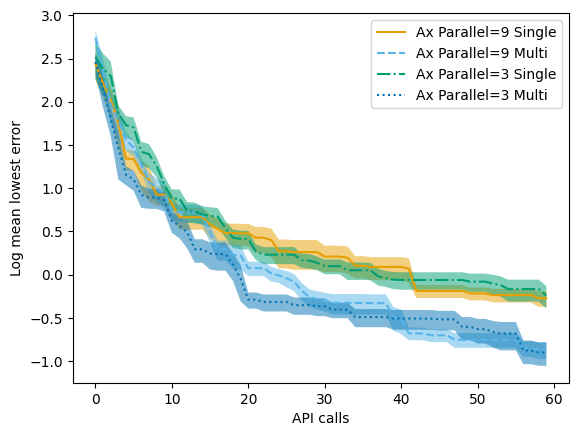

In [294]:
# Multi objective vs single
ids=[f"GRAMPIAN_11_9_True_*", f"GRAMPIAN_11_9_False_*", f"GRAMPIAN_11_3_True_*", f"GRAMPIAN_11_3_False_*"]
labels = [f"Ax Parallel=9 Single", f"Ax Parallel=9 Multi", f"Ax Parallel=3 Single", f"Ax Parallel=3 Multi"]
plot_by_API_calls(experiment_outputs, ids, labels, skopt_trace, include_skopt=False, save_file_path=r"../plots/grampian_3_9_its.png")

Number of calibrations Ax Parallel=2 Multi: 33
Number of calibrations Ax Parallel=9 Multi: 11


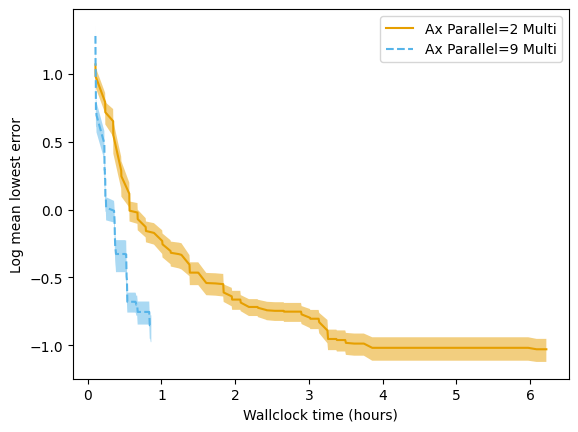

In [300]:
# Multi objective
nums = [2,9]
ids=[f"GRAMPIAN_11_{n}_False_*" for n in nums]
labels = [f"Ax Parallel={n} Multi" for n in nums]
plot_by_time(experiment_outputs, ids, labels, skopt_trace, skopt_time_per_it,  include_skopt=False, save_file_path=r"../plots/grampian_2_9_wc.png")

Number of calibrations Ax Parallel=3 Single: 12
Number of calibrations Ax Parallel=5 Single: 12
Number of calibrations Ax Parallel=9 Single: 11


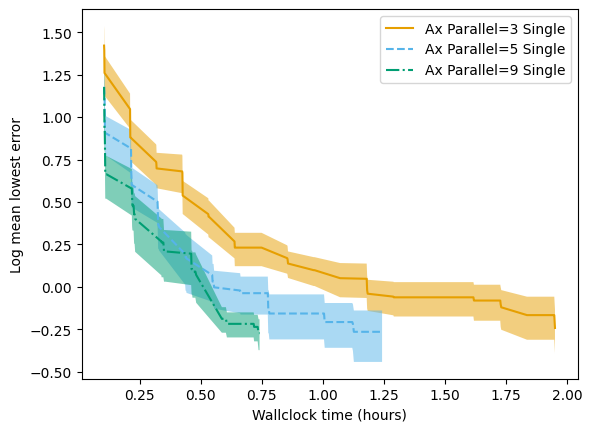

In [286]:
# Single objective
nums = [3,5,9]
ids=[f"GRAMPIAN_11_{n}_True_*" for n in nums]
labels = [f"Ax Parallel={n} Single" for n in nums]
plot_by_time(experiment_outputs, ids, labels, skopt_trace, skopt_time_per_it, save_file_path=None, include_skopt=False)

Number of calibrations Ax Parallel=9 Single: 11
Number of calibrations Ax Parallel=9 Multi: 11
Number of calibrations Ax Parallel=3 Single: 12
Number of calibrations Ax Parallel=3 Multi: 12


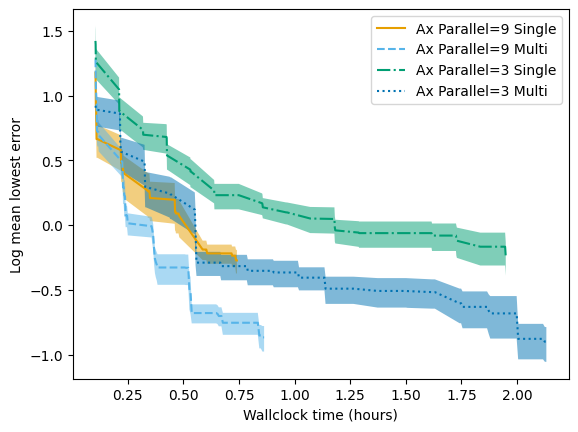

In [295]:
# Single vs multi objective 9
# nums = [3,5,9]
# ids=[f"GRAMPIAN_11_{n}_True_*" for n in nums]
# labels = [f"Ax Parallel={n} Single" for n in nums]
ids=[f"GRAMPIAN_11_9_True_*", f"GRAMPIAN_11_9_False_*", f"GRAMPIAN_11_3_True_*", f"GRAMPIAN_11_3_False_*"]
labels = [f"Ax Parallel=9 Single", f"Ax Parallel=9 Multi", f"Ax Parallel=3 Single", f"Ax Parallel=3 Multi"]

plot_by_time(experiment_outputs, ids, labels, skopt_trace, skopt_time_per_it,  include_skopt=False, save_file_path=r"../plots/grampian_3_9_wc.png")

In [ ]:
# Plot lowest error at iteration 60 against wall-clock time at that iteration
